In [23]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.signal import convolve2d
from scipy.optimize import minimize

# TP 2-3 Imagerie Computationnelle

En  plus  des  exercices  ci-dessous,  il  vous  est  fortement  conseillé  de  consulter  les  Numerical  
Tours with Matlab (https://www.numerical-tours.com/matlab/) ou with Python
(https://www.numerical-tours.com/python/),  et  en  particulier  l'implémentation  de  toutes  les méthodes de restauration d'images vues en cours, comme par exemple :
 - Simple Denoising Methods / Linear Image Denoising
 -  Simple Denoising Methods / Denoising by Sobolev and Total Variation Regularization
 -  Wavelet Denoising / Image Denoising with Wavelets
 -  Advanced Denoising Methods / Non-Local Means
 -  Advanced Denoising Methods / Bilateral Filtering
 -  Sparsity and Redundant Representations / Compressed Sensing of Images
 -  Sparsity and Redundant Representations / Dictionary Learning for Denoising
 -  Inverse Problems / Image Deconvolution using Variational Method
 -  Inverse Problems / Image Deconvolution using Sparse Regularization
 -  Inverse Problems / Reconstruction from Partial Tomography Measurements
 -  Inverse Problems / Tomography Inversion using Tikhonov and Sparse Regularization

## Déconvolution : calculs de base

### 1. Vérification des propriétés du produit de convolution vues en cours à partir des images :

h = $\begin{bmatrix}1 & 4 & 7 \\ 2 & 5 & 8 \\ 3 & 6 & 9 \end{bmatrix}$

x = round(5 x rand(3,3))

#### a. Calcul du produit de convolution complet dans le domaine spatial.

In [24]:
h = np.array([[1, 4, 7],
              [2, 5, 8],
              [3, 6, 9]])

x = np.round(5 * np.random.rand(3, 3))

In [25]:
def spatial_convolution(image, kernel):
    h, w = image.shape
    kh, kw = kernel.shape

    result = np.zeros((h + kh - 1, w + kw - 1))

    for i in range(h):
        for j in range(w):
            result[i:i+kh, j:j+kw] += image[i, j] * kernel

    return result

In [26]:
print("Image x :")
print(x)
print("\nNoyau h :")
print(h)
print("\nRésultat de la convolution :")
spatial_convolution_var = spatial_convolution(x, h)
print(spatial_convolution_var)

Image x :
[[3. 3. 5.]
 [1. 3. 2.]
 [0. 2. 3.]]

Noyau h :
[[1 4 7]
 [2 5 8]
 [3 6 9]]

Résultat de la convolution :
[[  3.  15.  38.  41.  35.]
 [  7.  28.  70.  78.  54.]
 [ 11.  40.  98. 117.  82.]
 [  3.  19.  49.  70.  42.]
 [  0.   6.  21.  36.  27.]]


#### b. Calculer le produit de convolution complet dans le domaine fréquentiel.

In [27]:
def frequency_convolution(image, kernel):
    h, w = image.shape
    kh, kw = kernel.shape

    padded_image = np.pad(image, ((0, kh-1), (0, kw-1)))
    padded_kernel = np.pad(kernel, ((0, h-1), (0, w-1)))

    print("Original image padded : \n", padded_image)
    print("Original kernel padded : \n", padded_kernel)

    F_image = np.fft.fft2(padded_image)
    F_kernel = np.fft.fft2(padded_kernel)

    F_result = F_image * F_kernel

    result = np.real(np.fft.ifft2(F_result))

    return result

In [28]:
print("Image x :")
print(x)
print("\nNoyau h :")
print(h)
print("\nRésultat de la convolution dans le domaine fréquentiel :")
frequency_convolution_var = frequency_convolution(x, h)
print(frequency_convolution_var)

Image x :
[[3. 3. 5.]
 [1. 3. 2.]
 [0. 2. 3.]]

Noyau h :
[[1 4 7]
 [2 5 8]
 [3 6 9]]

Résultat de la convolution dans le domaine fréquentiel :
Original image padded : 
 [[3. 3. 5. 0. 0.]
 [1. 3. 2. 0. 0.]
 [0. 2. 3. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
Original kernel padded : 
 [[1 4 7 0 0]
 [2 5 8 0 0]
 [3 6 9 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]]
[[3.00000000e+00 1.50000000e+01 3.80000000e+01 4.10000000e+01
  3.50000000e+01]
 [7.00000000e+00 2.80000000e+01 7.00000000e+01 7.80000000e+01
  5.40000000e+01]
 [1.10000000e+01 4.00000000e+01 9.80000000e+01 1.17000000e+02
  8.20000000e+01]
 [3.00000000e+00 1.90000000e+01 4.90000000e+01 7.00000000e+01
  4.20000000e+01]
 [2.84217094e-15 6.00000000e+00 2.10000000e+01 3.60000000e+01
  2.70000000e+01]]


In [29]:
comparison = np.isclose(spatial_convolution_var, frequency_convolution_var)
print(spatial_convolution_var, "\n", frequency_convolution_var)
print("Comparison matrix (True indicates similarity):")
print(comparison)
# print(spatial_convolution_var == frequency_convolution_var)
# print(np.array_equal(spatial_convolution_var, frequency_convolution_var))

[[  3.  15.  38.  41.  35.]
 [  7.  28.  70.  78.  54.]
 [ 11.  40.  98. 117.  82.]
 [  3.  19.  49.  70.  42.]
 [  0.   6.  21.  36.  27.]] 
 [[3.00000000e+00 1.50000000e+01 3.80000000e+01 4.10000000e+01
  3.50000000e+01]
 [7.00000000e+00 2.80000000e+01 7.00000000e+01 7.80000000e+01
  5.40000000e+01]
 [1.10000000e+01 4.00000000e+01 9.80000000e+01 1.17000000e+02
  8.20000000e+01]
 [3.00000000e+00 1.90000000e+01 4.90000000e+01 7.00000000e+01
  4.20000000e+01]
 [2.84217094e-15 6.00000000e+00 2.10000000e+01 3.60000000e+01
  2.70000000e+01]]
Comparison matrix (True indicates similarity):
[[ True  True  True  True  True]
 [ True  True  True  True  True]
 [ True  True  True  True  True]
 [ True  True  True  True  True]
 [ True  True  True  True  True]]


#### c. Calcul  du  produit  de  convolution  circulaire  en  utilisant  la  fonction  imfilter.  Le résultat est de même taille que x.

In [30]:
def circular_convolution_imfilter(image, kernel):
    result = convolve2d(image, kernel, boundary='wrap', mode='same')
    return result

print("Image x :")
print(x)
print("\nNoyau h :")
print(h)
print("\nRésultat de la convolution circulaire :")
print(circular_convolution_imfilter(x, h))

Image x :
[[3. 3. 5.]
 [1. 3. 2.]
 [0. 2. 3.]]

Noyau h :
[[1 4 7]
 [2 5 8]
 [3 6 9]]

Résultat de la convolution circulaire :
[[115.  91. 121.]
 [122.  98. 128.]
 [111.  87. 117.]]



#### d. Calcul du produit de convolution circulaire en passant par le domaine de Fourier. Le résultat est de même taille que x.  

In [31]:
def circular_convolution_fourier(image, kernel):
    H = np.zeros_like(image)
    H[:kernel.shape[0], :kernel.shape[1]] = kernel
    H = np.roll(H, -int(kernel.shape[0]/2), axis=0)
    H = np.roll(H, -int(kernel.shape[1]/2), axis=1)
    H = np.fft.fft2(H)
    result = np.real(np.fft.ifft2(np.fft.fft2(image) * H))
    return result

print("Image x :")
print(x)
print("\nNoyau h :")
print(h)
print("\nRésultat de la convolution circulaire dans le domaine de Fourier :")
circular_convolution_fourier_var = circular_convolution_fourier(x, h)
print(circular_convolution_fourier_var)

Image x :
[[3. 3. 5.]
 [1. 3. 2.]
 [0. 2. 3.]]

Noyau h :
[[1 4 7]
 [2 5 8]
 [3 6 9]]

Résultat de la convolution circulaire dans le domaine de Fourier :
[[115.  91. 121.]
 [122.  98. 128.]
 [111.  87. 117.]]



#### e. Obtention du résultat en c. en définissant une matrice BCCB H à partir de h et en multipliant cette matrice par la version vectorisée de l'image x.

In [32]:
def circulant_vector(v):
    n = len(v)
    return np.array([np.roll(v, i) for i in range(n)]).T

def construct_BCCB(h):
    length = h.shape[0]
    h = np.roll(h, -1, axis=0)
    h = np.roll(h, -1, axis=1)
    blocks = h.T.flatten()
    blocks = np.split(blocks, length)

    block_circulants = np.array([circulant_vector(blocks[i]) for i in range(length)])
    BCCB_matrix = np.vstack([
        np.hstack([np.roll(block_circulants, i, axis=0)[j] for i in range(length)])
        for j in range(length)
    ])

    return BCCB_matrix

print("Image x :")
print(x)
print("\nNoyau h :")
print(h)
print("\n", "Résultat de la convolution circulaire en utilisant la matrice BCCB H :")
bccb_H = construct_BCCB(h)
print(bccb_H)


x_vectorized = x.flatten()
result = np.dot(bccb_H, x_vectorized)
print("\n", result)

Image x :
[[3. 3. 5.]
 [1. 3. 2.]
 [0. 2. 3.]]

Noyau h :
[[1 4 7]
 [2 5 8]
 [3 6 9]]

 Résultat de la convolution circulaire en utilisant la matrice BCCB H :
[[5 4 6 2 1 3 8 7 9]
 [6 5 4 3 2 1 9 8 7]
 [4 6 5 1 3 2 7 9 8]
 [8 7 9 5 4 6 2 1 3]
 [9 8 7 6 5 4 3 2 1]
 [7 9 8 4 6 5 1 3 2]
 [2 1 3 8 7 9 5 4 6]
 [3 2 1 9 8 7 6 5 4]
 [1 3 2 7 9 8 4 6 5]]

 [109. 101. 111. 130. 122. 132.  97.  89.  99.]


## Problèmes inverses à la déconvolution et ses solutions

Nous examinons le modèle de formation d'image suivant :
$$
i(x, y) = h(x, y) * i_{\text{ideal}}(x, y) + b(x, y)
$$

Avec $ * $ représente le produit de convolution circulaire et $ b(x, y) $ représente un bruit gaussien. Généralement, $ h(x, y) $ est un noyau qui induit un flou dans l'image. Dans ce cas suit, nous supposerons que $ h(x, y) $ est connu. L’objectif est donc de retrouver $ i_{\text{ideal}}(x, y) $ à partir de $ i(x, y) $.

### A. Modèle direct : calculer l'image floue et bruitée à partir d'une image parfaite

Visualisez-les. Pour chaque cas, l’image constituera par la suite $ i_{\text{ideal}}(x, y) $.

1. Chargez une image de votre choix, ou l’image `coat_of_arms.png` (à télécharger ici : http://www.ogemarques.com/wp-content/uploads/2014/11/Tutorial_Images.zip)


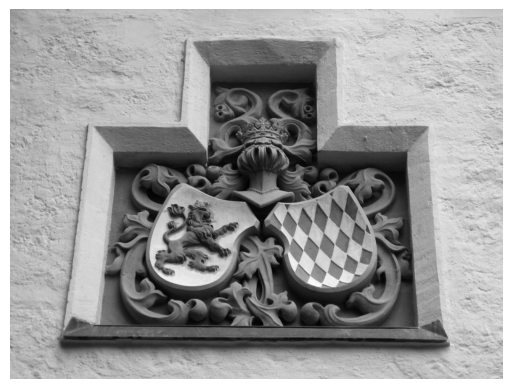

In [33]:
image_path = 'data/coat_of_arms.png'
img = mpimg.imread(image_path)

plt.imshow(img, cmap='gray')
plt.axis('off')
plt.show()


2. Créez une image constante par morceaux

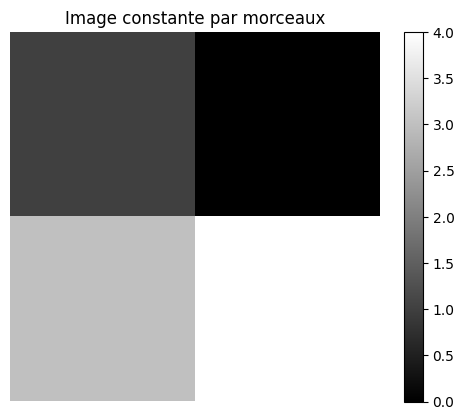

In [34]:
image_constante = np.zeros((256, 256))

half = int(len(image_constante)/2)


image_constante[0:half, 0:half] = 1
image_constante[0:half, half:6] = 2
image_constante[half:half*2, 0:half] = 3
image_constante[half:half*2, half:half*2] = 4

plt.imshow(image_constante, cmap='gray', interpolation='nearest')
plt.colorbar()
plt.title("Image constante par morceaux")
plt.axis('off')
plt.show()


3. Créez une image sparse.


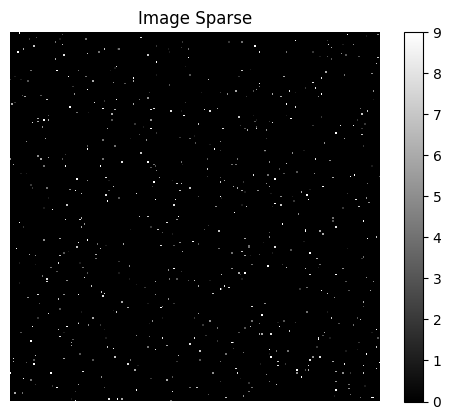

In [35]:
taille_image = (256, 256)

image_sparse = np.zeros(taille_image)

nombre_valeurs_non_nulles = len(image_sparse.flatten()) // 100

positions = np.random.choice(taille_image[0] * taille_image[1], nombre_valeurs_non_nulles, replace=False)

for pos in positions:
    row = pos // taille_image[1]
    col = pos % taille_image[1]
    image_sparse[row, col] = np.random.randint(1, 10)

plt.imshow(image_sparse, cmap='gray', interpolation='nearest')
plt.colorbar()
plt.title("Image Sparse")
plt.axis('off')
plt.show()


### B. Pour chaque image, vous devez :

1. Générer et visualiser :\
   a. Générer l’image $ i(x, y) $, en considérant $ h(x, y) $ un filtre Gaussien de taille 15x15, l’image sera bruitée avec un bruit additif Gaussien, de puissance telle que le RSB soit de 40 dB.\
   b. Visualiser la transformée de Fourier de $ i_{\text{ideal}} $, de $ i(x, y) $ et de $ h(x, y) $. Commenter les trois résultats.
2. Estimer l’image par une régularisation Tikhonov (norme L2).

In [36]:
def show_fft(image):
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20 * np.log(np.abs(fshift))
    return magnitude_spectrum

EQM0 :  0.004099151001004956
EQM1 :  0.0031073965680462196
PSNR0 :  72.00386444089509
PSNR1 :  73.20683679121201


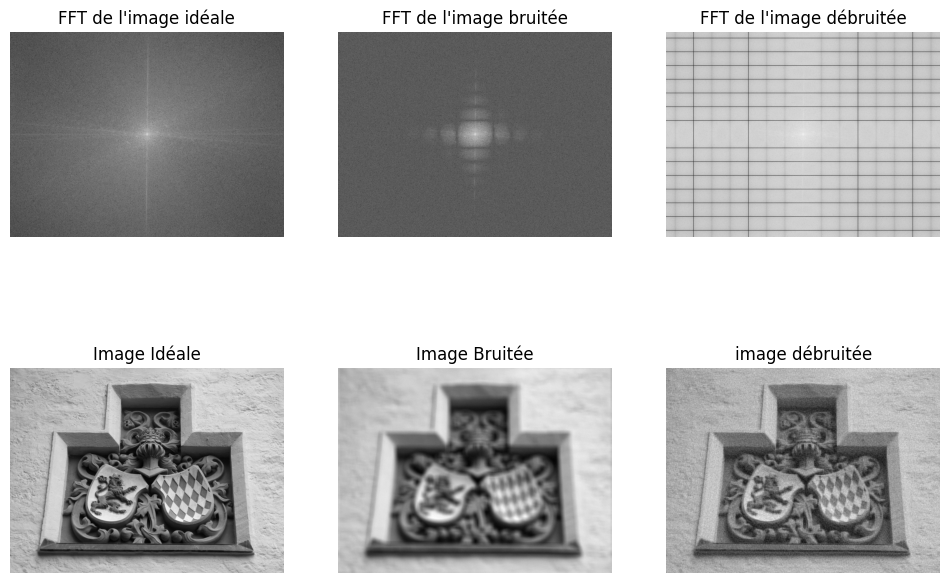

EQM0 :  0.10722521312757484
EQM1 :  0.04948053770646992
PSNR0 :  57.82783442724926
PSNR1 :  61.186459503941755


<ipython-input-36-d127c107fa80>:4: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum = 20 * np.log(np.abs(fshift))


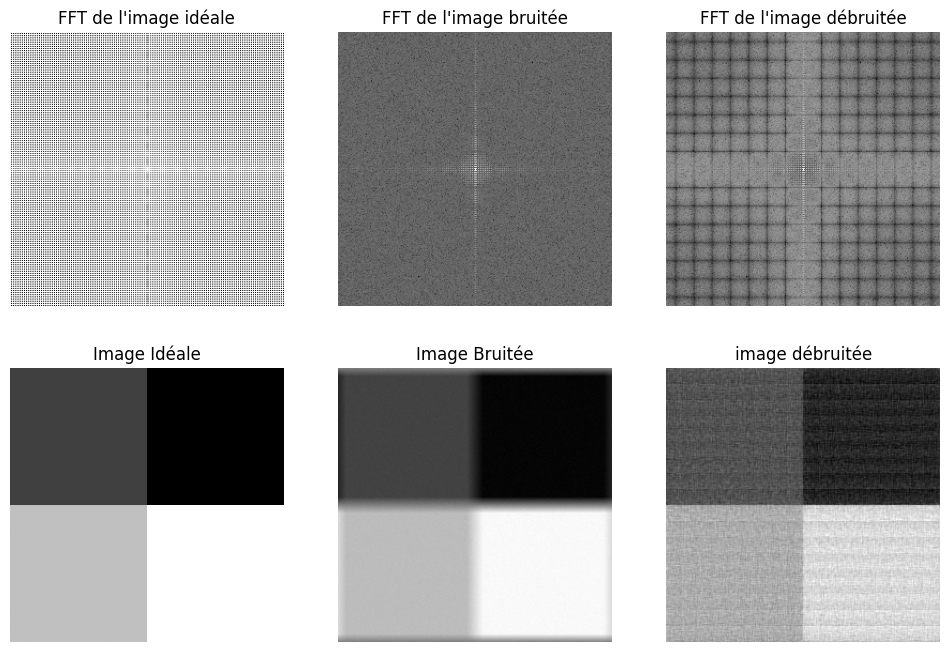

EQM0 :  0.3199108240930173
EQM1 :  0.25423620913386313
PSNR0 :  53.080514263032086
PSNR1 :  54.078429566359745


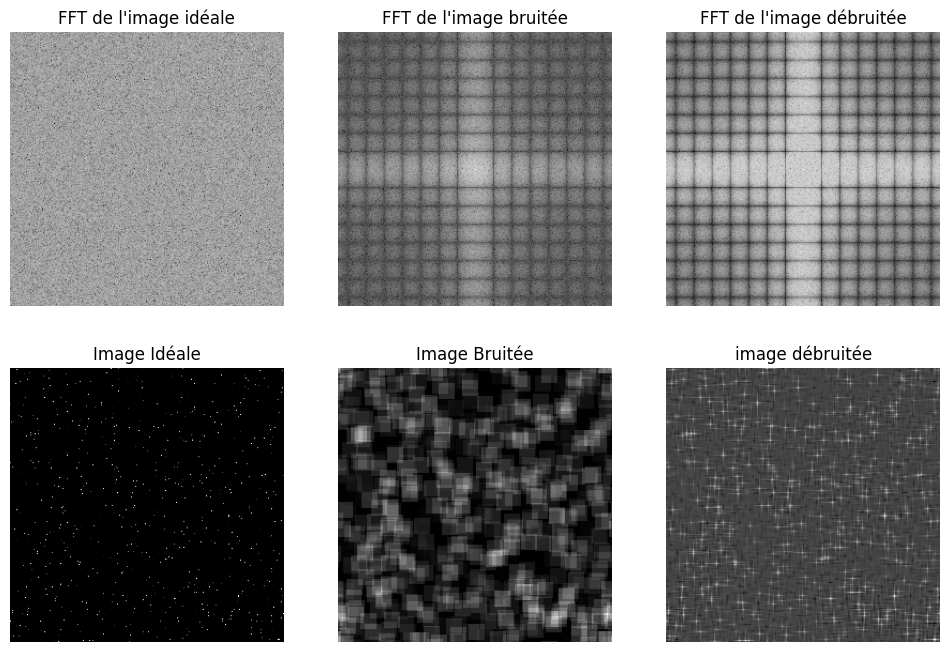

In [37]:
images = [img, image_constante, image_sparse]
h = np.ones((15, 15))/(15.0*15.0)


for i_ideal in images:
    taille_image = i_ideal.shape

    H = np.zeros_like(i_ideal)
    H[:h.shape[0], :h.shape[1]] = h
    H = np.roll(H, -int(h.shape[0]/2.0), axis=0)
    H = np.roll(H, -int(h.shape[1]/2.0), axis=1)

    D = np.fft.fft2(H)
    DT = np.conj(D)

    my_conv = np.real(np.fft.ifft2(D * np.fft.fft2(i_ideal)))

    SNRdb = 40
    SNR = (10 ** (SNRdb / 10))
    ps_in = np.sum(np.sum(my_conv ** 2)) / (my_conv.shape[0] * my_conv.shape[1])
    pb_norm = ps_in / SNR
    Mnoise = np.sqrt(pb_norm) * np.random.randn(my_conv.shape[0], my_conv.shape[1])
    MCB = my_conv + Mnoise

    alpha_regularisation = 0.001
    i_ideal_est = np.real(np.fft.ifft2(1/(DT*D + alpha_regularisation) * DT * np.fft.fft2(MCB)))

    EQM0 = np.mean(np.square(MCB - i_ideal))
    EQM1 = np.mean(np.square(i_ideal_est - i_ideal))

    print("EQM0 : ", EQM0)
    print("EQM1 : ", EQM1)

    PSNR0 = 20 * np.log10(255.0 / np.sqrt(EQM0))
    PSNR1 = 20 * np.log10(255.0 / np.sqrt(EQM1))

    print("PSNR0 : ", PSNR0)
    print("PSNR1 : ", PSNR1)

    col = 3
    plt.figure(figsize=(12, 16))
    plt.subplot(1, col, 1)
    plt.title("Image Idéale")
    plt.imshow(i_ideal, cmap='gray')
    plt.axis('off')

    plt.subplot(1, col, 2)
    plt.title("Image Bruitée")
    plt.imshow(MCB, cmap='gray')
    plt.axis('off')

    plt.subplot(1, col, 3)
    plt.title("image débruitée")
    plt.imshow(i_ideal_est, cmap='gray')
    plt.axis('off')

    plt.subplot(2, col, 1)
    plt.title("FFT de l'image idéale")
    plt.imshow(show_fft(i_ideal), cmap='gray')
    plt.axis('off')

    plt.subplot(2, col, 2)
    plt.title("FFT de l'image bruitée")
    plt.imshow(show_fft(MCB), cmap='gray')
    plt.axis('off')

    plt.subplot(2, col, 3)
    plt.title("FFT de l'image débruitée")
    plt.imshow(show_fft(i_ideal_est), cmap='gray')
    plt.axis('off')

    plt.show()



3. Faire varier le paramètre de régularisation. Commenter les résultats.

Le choix du paramètre de régularisation alpha dépend d'un compromis entre la réduction du bruit et les détails de l'image. Donc une valeur alpha trop faible peut laisser un peu de bruit, tandis qu'une valeur trop élevée peut entraîner une perte de détails. dans notre cas le alpha a 0.001 a l'air d'etre un bon compromis.

Alpha : 0.0001
EQM : 0.03755948726600554
PSNR : 62.383607058964245 

Alpha : 0.001
EQM : 0.0031129028585246436
PSNR : 73.19914792599454 

Alpha : 0.01
EQM : 0.0018748479867494328
PSNR : 75.40114300106693 

Alpha : 0.1
EQM : 0.00614426482849588
PSNR : 70.24610434593848 

Alpha : 1
EQM : 0.09989786994956773
PSNR : 58.13524132692089 



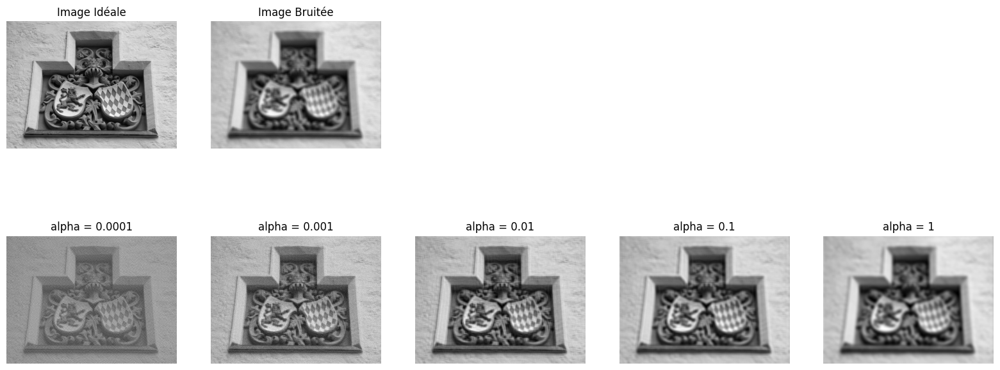

Alpha : 0.0001
EQM : 0.6266448343301422
PSNR : 50.16058896901204 

Alpha : 0.001
EQM : 0.049331736491683
PSNR : 61.199539578427746 

Alpha : 0.01
EQM : 0.03350832003226813
PSNR : 62.87927706204975 

Alpha : 0.1
EQM : 0.12444623700697505
PSNR : 57.18098591878413 

Alpha : 1
EQM : 1.7327479125803829
PSNR : 45.74344976537564 



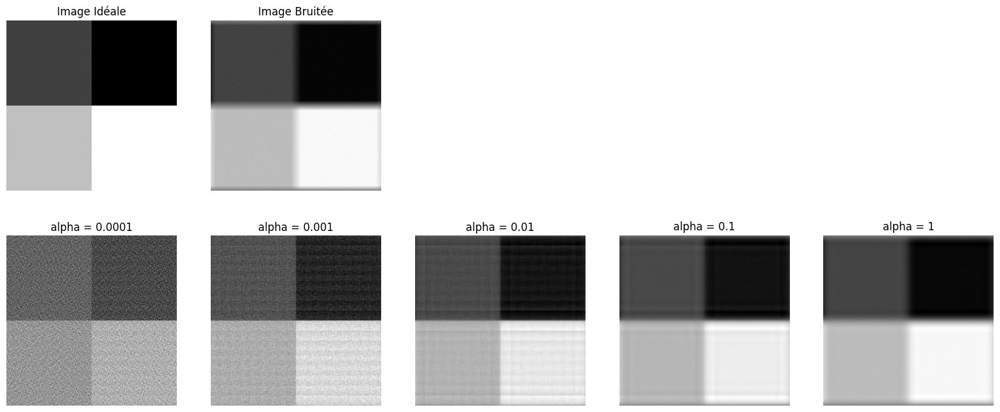

Alpha : 0.0001
EQM : 0.18493119386706003
PSNR : 55.46070187503763 

Alpha : 0.001
EQM : 0.25423595690531164
PSNR : 54.07843387501124 

Alpha : 0.01
EQM : 0.29479730315142616
PSNR : 53.43556854651763 

Alpha : 0.1
EQM : 0.31387705856156506
PSNR : 53.16320786818786 

Alpha : 1
EQM : 0.32016644121896093
PSNR : 53.07704552201612 



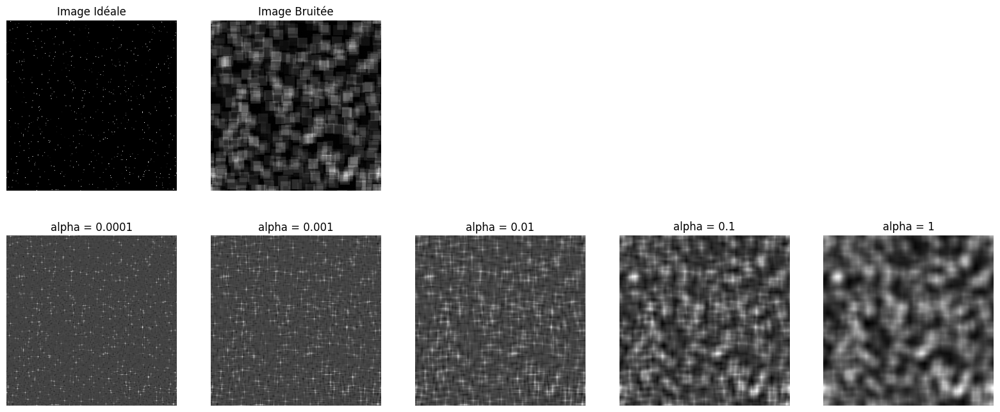

In [38]:
images = [img, image_constante, image_sparse]
h = np.ones((15, 15))/(15.0*15.0)
alpha_values = [0.0001, 0.001, 0.01, 0.1, 1]

for i_ideal in images:
    taille_image = i_ideal.shape

    H = np.zeros_like(i_ideal)
    H[:h.shape[0], :h.shape[1]] = h
    H = np.roll(H, -int(h.shape[0]/2.0), axis=0)
    H = np.roll(H, -int(h.shape[1]/2.0), axis=1)

    D = np.fft.fft2(H)
    DT = np.conj(D)

    my_conv = np.real(np.fft.ifft2(D * np.fft.fft2(i_ideal)))

    SNRdb = 40
    SNR = (10 ** (SNRdb / 10))
    ps_in = np.sum(np.sum(my_conv ** 2)) / (my_conv.shape[0] * my_conv.shape[1])
    pb_norm = ps_in / SNR
    Mnoise = np.sqrt(pb_norm) * np.random.randn(my_conv.shape[0], my_conv.shape[1])
    MCB = my_conv + Mnoise

    plt.figure(figsize=(24, 16))
    plt.subplot(2, len(alpha_values) + 1, 1)
    plt.imshow(i_ideal, cmap='gray')
    plt.title("Image Idéale")
    plt.axis('off')
    plt.subplot(2, len(alpha_values) + 1, 2)
    plt.imshow(MCB, cmap='gray')
    plt.title("Image Bruitée")
    plt.axis('off')
    col = len(alpha_values) + 1
    for i, alpha_regularisation in enumerate(alpha_values):
        i_ideal_est = np.real(np.fft.ifft2(1/(DT*D + alpha_regularisation) * DT * np.fft.fft2(MCB)))

        EQM = np.mean(np.square(i_ideal_est - i_ideal))
        PSNR = 20 * np.log10(255.0 / np.sqrt(EQM))

        print(f"Alpha : {alpha_regularisation}")
        print(f"EQM : {EQM}")
        print(f"PSNR : {PSNR} \n")
        plt.subplot(1, col, i+1)
        plt.imshow(i_ideal_est, cmap='gray')
        plt.title(f"alpha = {alpha_regularisation}")
        plt.axis('off')
    plt.show()



4. Comparer les résultats avec l’estimation des paramètres de régularisation par les méthodes vues en cours (GCV et ML). Commenter les résultats.

Aprés avoir tester les deux methodes de regularisation, nous pouvons constater sur les image ci-dessous pas de grande difference entre les deux methodes.

Meilleur alpha selon GCV : 0.02928196656218962
Meilleur alpha selon ML : 0.029281966377508323


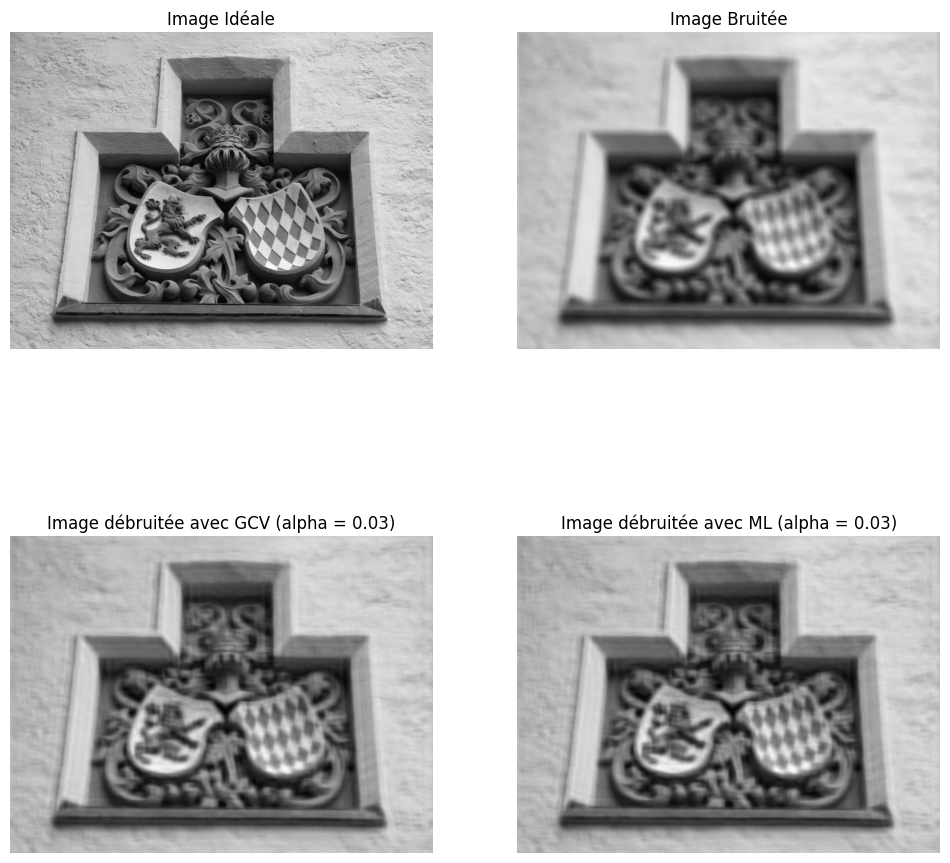

Meilleur alpha selon GCV : 0.04031747169896491
Meilleur alpha selon ML : 0.0403174714308629


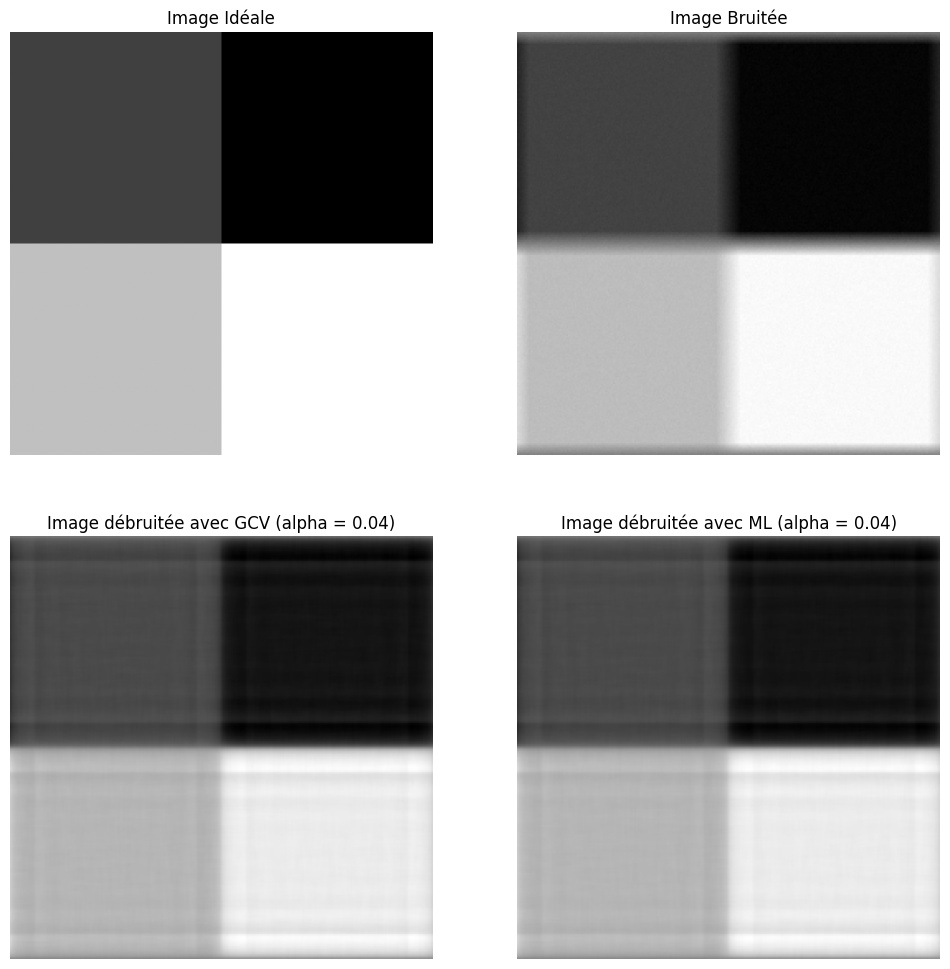

Meilleur alpha selon GCV : 0.23961225054837
Meilleur alpha selon ML : 0.23961210286114842


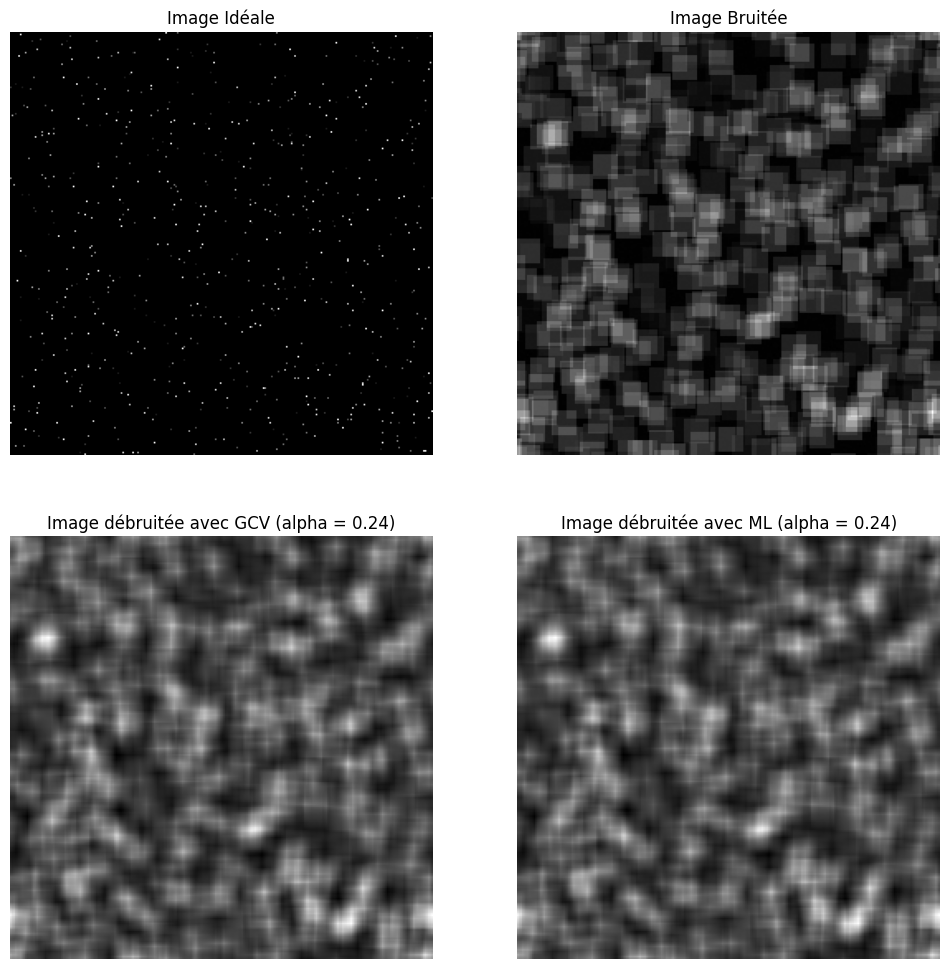

In [39]:
import numpy as np
import matplotlib.pyplot as plt

images = [img, image_constante, image_sparse]
h = np.ones((15, 15)) / (15.0 * 15.0)

for i_ideal in images:
    taille_image = i_ideal.shape

    H = np.zeros_like(i_ideal)
    H[:h.shape[0], :h.shape[1]] = h
    H = np.roll(H, -int(h.shape[0] / 2.0), axis=0)
    H = np.roll(H, -int(h.shape[1] / 2.0), axis=1)

    D = np.fft.fft2(H)

    my_conv = np.real(np.fft.ifft2(D * np.fft.fft2(i_ideal)))

    SNRdb = 40
    SNR = (10 ** (SNRdb / 10))
    ps_in = np.sum(np.sum(my_conv ** 2)) / (my_conv.shape[0] * my_conv.shape[1])
    pb_norm = ps_in / SNR
    Mnoise = np.sqrt(pb_norm) * np.random.randn(my_conv.shape[0], my_conv.shape[1])
    MCB = my_conv + Mnoise

    D = np.fft.fft2(H)
    DT = np.conj(D)

    plt.figure(figsize=(12, 24))
    plt.subplot(2, 2, 1)
    plt.imshow(i_ideal, cmap='gray')
    plt.title("Image Idéale")
    plt.axis('off')
    plt.subplot(2, 2, 2)
    plt.imshow(MCB, cmap='gray')
    plt.title("Image Bruitée")
    plt.axis('off')

    def gcv(alpha):
        i_ideal_est = np.real(np.fft.ifft2(1 / (DT * D + alpha) * DT * np.fft.fft2(MCB)))
        residual = MCB - i_ideal_est
        return np.sum(residual ** 2) / (len(MCB) - np.trace(DT * D))

    result_gcv = minimize(gcv, x0=0.01, bounds=[(1e-20, 10)])
    best_alpha_gcv = result_gcv.x[0]
    print(f"Meilleur alpha selon GCV : {best_alpha_gcv}")

    def ml(alpha):
        i_ideal_est = np.real(np.fft.ifft2(1 / (DT * D + alpha) * DT * np.fft.fft2(MCB)))
        residual = MCB - i_ideal_est
        return -np.sum(-0.5 * (residual ** 2))

    result_ml = minimize(ml, x0=0.01, bounds=[(1e-20, 10)])
    best_alpha_ml = result_ml.x[0]
    print(f"Meilleur alpha selon ML : {best_alpha_ml}")

    i_ideal_est_gcv = np.real(np.fft.ifft2(1 / (DT * D + best_alpha_gcv) * DT * np.fft.fft2(MCB)))
    plt.subplot(1, 2, 1)
    plt.imshow(i_ideal_est_gcv, cmap='gray')
    plt.title(f"Image débruitée avec GCV (alpha = {best_alpha_gcv:.2f})")
    plt.axis('off')

    i_ideal_est_ml = np.real(np.fft.ifft2(1 / (DT * D + best_alpha_ml) * DT * np.fft.fft2(MCB)))
    plt.subplot(1, 2, 2)
    plt.imshow(i_ideal_est_ml, cmap='gray')
    plt.title(f"Image débruitée avec ML (alpha = {best_alpha_ml:.2f})")
    plt.axis('off')
    plt.show()


5. Faire varier des paramètres du filtre $ h(x,y) $ et le RSB entré et puis commenter les résultats.

Nous avons fait varier les parametres du filtre h(x,y) et le RSB entré, nous avons constaté que plus le filtre h(x,y) est grand plus l'image est floue et plus le RSB est petit plus l'image est bruitée. De plus lors du debruitage de l'image, l'augmentation du filtre $ h(x,y) $ rajoute du bruit lors du debruitage de l'image. alors que plus le RSB est petit plus l'image a du mal a etre debruitée est nous perdons des details de l'image.

Taille du filtre : 5
SNR: 20 dB
EQM0 :  0.004978434588602415
EQM1 :  0.42504265979965977
PSNR0 :  71.15987555539138
PSNR1 :  51.84647840262717


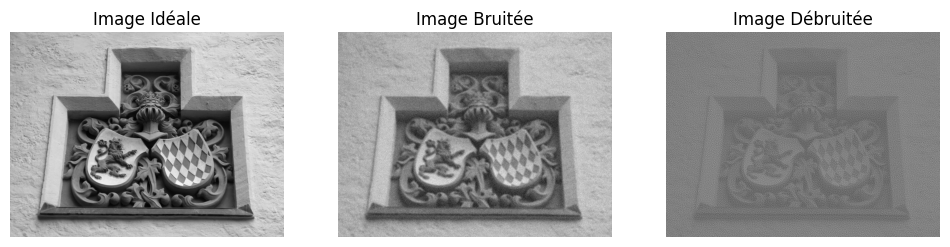

Taille du filtre : 15
SNR: 20 dB
EQM0 :  0.007849333031179758
EQM1 :  0.2148702103996125
PSNR0 :  69.18247605165247
PSNR1 :  54.80904151778745


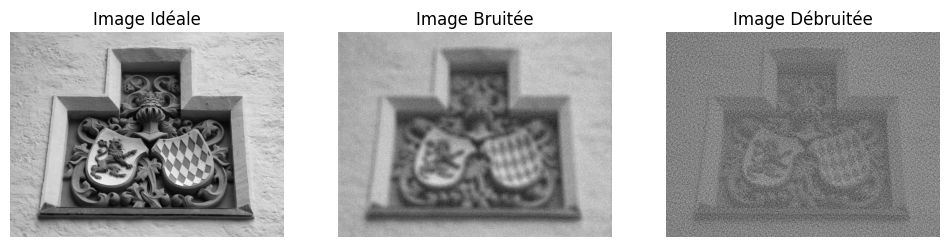

Taille du filtre : 25
SNR: 20 dB
EQM0 :  0.010383055214345772
EQM1 :  0.11215876446101267
PSNR0 :  67.9675519738461
PSNR1 :  57.63247144399392


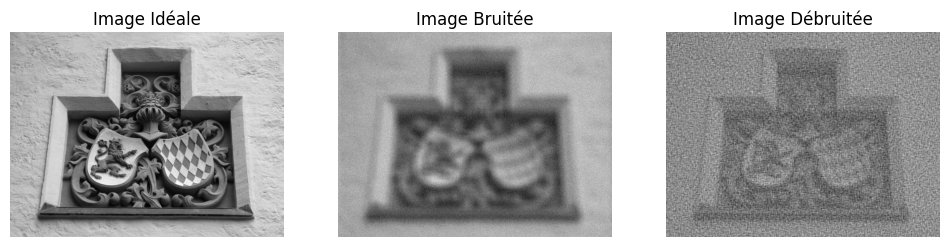

Taille du filtre : 5
SNR: 40 dB
EQM0 :  0.0012220003301441475
EQM1 :  0.004388112587089098
PSNR0 :  77.26009037629328
PSNR1 :  71.70802599001642


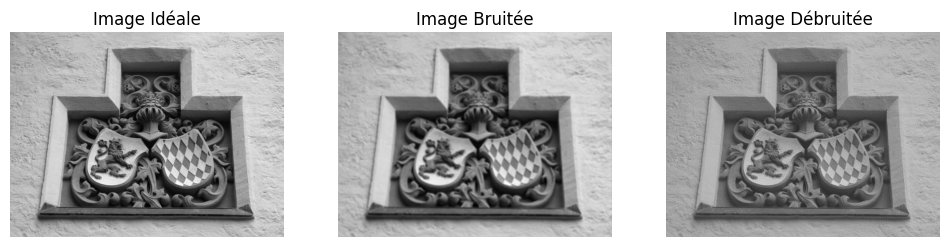

Taille du filtre : 15
SNR: 40 dB
EQM0 :  0.004098969718597642
EQM1 :  0.003109074138618376
PSNR0 :  72.00405650917968
PSNR1 :  73.20449282565806


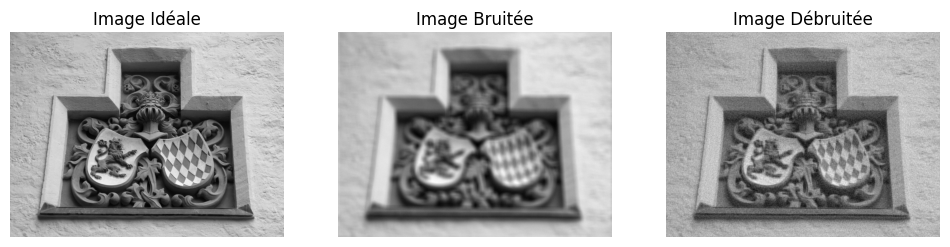

Taille du filtre : 25
SNR: 40 dB
EQM0 :  0.006688320843056033
EQM1 :  0.0030331462871138496
PSNR0 :  69.87763262551391
PSNR1 :  73.31187004248561


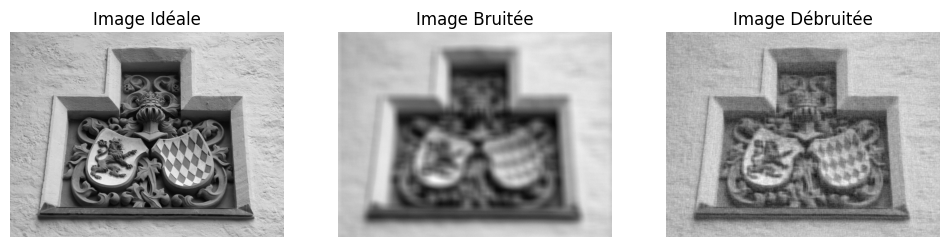

Taille du filtre : 5
SNR: 60 dB
EQM0 :  0.001184500086920042
EQM1 :  0.00018651186718243097
PSNR0 :  77.39545263940074
PSNR1 :  85.42373891008029


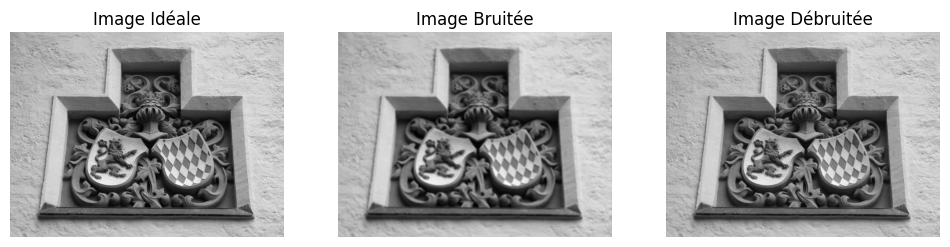

Taille du filtre : 15
SNR: 60 dB
EQM0 :  0.004063818435106721
EQM1 :  0.0009980737821088468
PSNR0 :  72.04146064739867
PSNR1 :  78.13917713389839


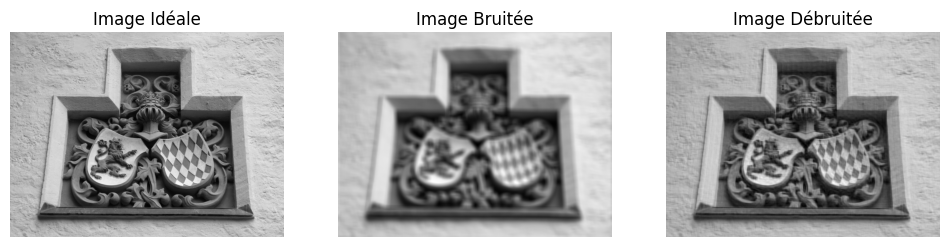

Taille du filtre : 25
SNR: 60 dB
EQM0 :  0.0066522125652803
EQM1 :  0.001922796595483259
PSNR0 :  69.90114242621492
PSNR1 :  75.29147016375387


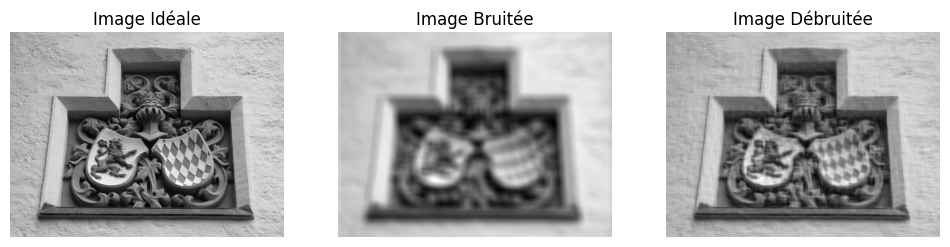

Taille du filtre : 5
SNR: 20 dB
EQM0 :  0.0981919600579507
EQM1 :  7.156081598124102
PSNR0 :  58.21004431588221
PSNR1 :  39.58405076846668


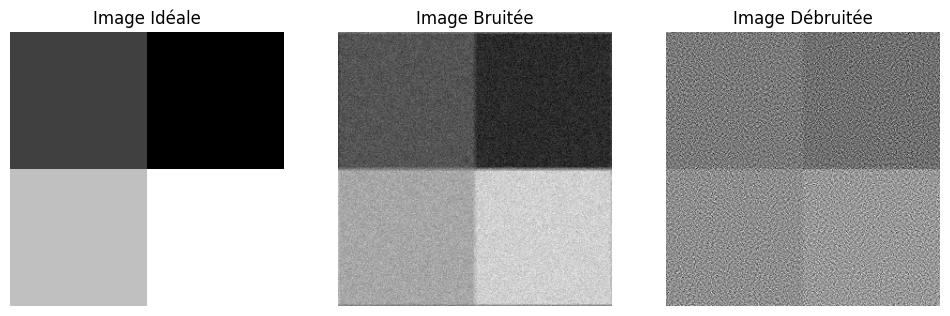

Taille du filtre : 15
SNR: 20 dB
EQM0 :  0.16793643912290682
EQM1 :  3.553694557982581
PSNR0 :  55.87935420578707
PSNR1 :  42.62400263646036


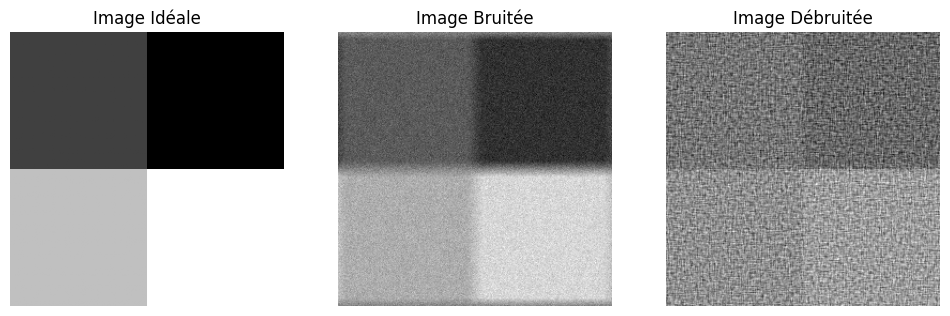

Taille du filtre : 25
SNR: 20 dB
EQM0 :  0.23934216938075287
EQM1 :  1.8298303198625985
PSNR0 :  54.34061137741652
PSNR1 :  45.50669541391003


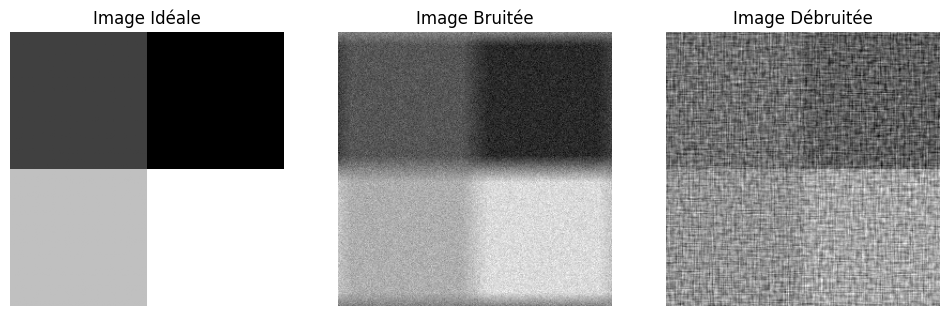

Taille du filtre : 5
SNR: 40 dB
EQM0 :  0.035019769194550104
EQM1 :  0.07363670364104491
PSNR0 :  62.687670814238416
PSNR1 :  59.45986021863565


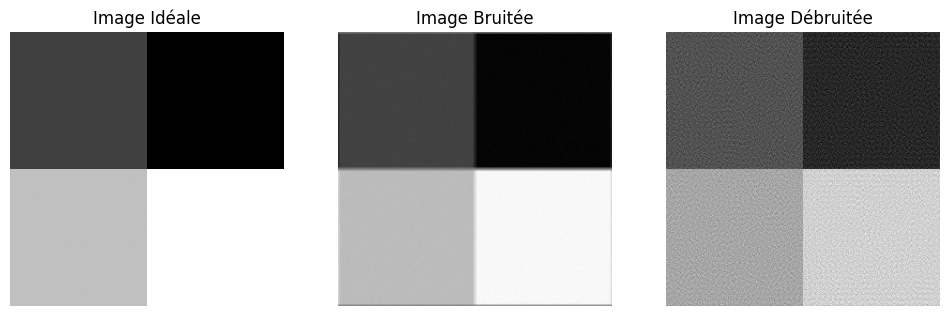

Taille du filtre : 15
SNR: 40 dB
EQM0 :  0.10734648923044726
EQM1 :  0.048733609876518307
PSNR0 :  57.82292515475024
PSNR1 :  61.25251778516241


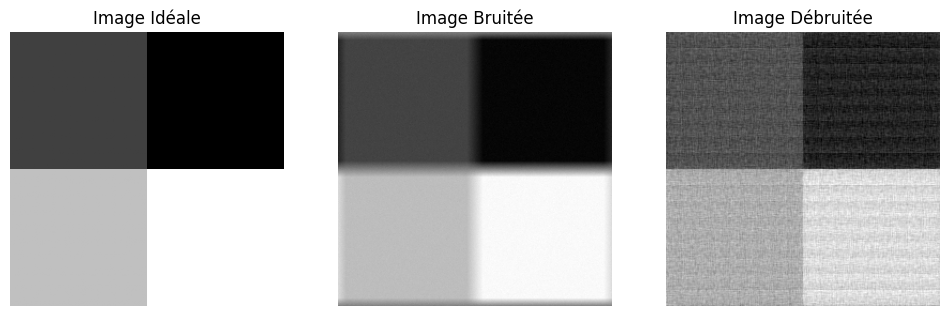

Taille du filtre : 25
SNR: 40 dB
EQM0 :  0.1788509555458519
EQM1 :  0.032480377863164635
PSNR0 :  55.605890960743835
PSNR1 :  63.014592878685775


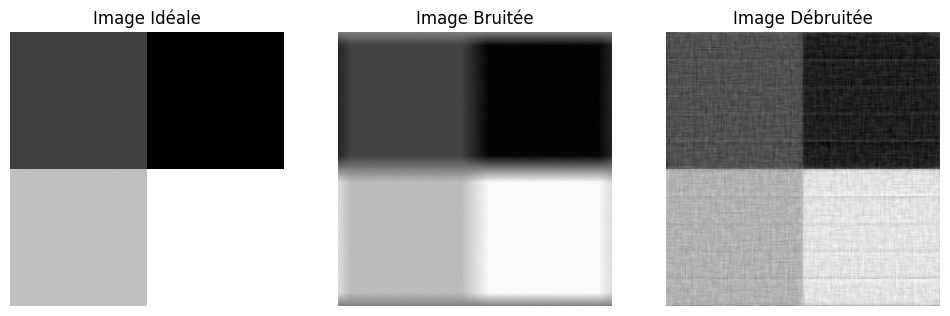

Taille du filtre : 5
SNR: 60 dB
EQM0 :  0.03436877875814802
EQM1 :  0.0027110150963118116
PSNR0 :  62.76916260444981
PSNR1 :  73.79948424907984


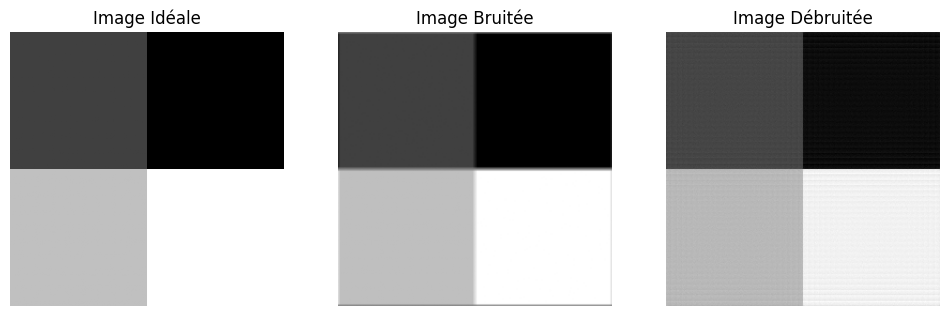

Taille du filtre : 15
SNR: 60 dB
EQM0 :  0.10675855554081366
EQM1 :  0.013989043191287177
PSNR0 :  57.846776717818315
PSNR1 :  66.67292349803861


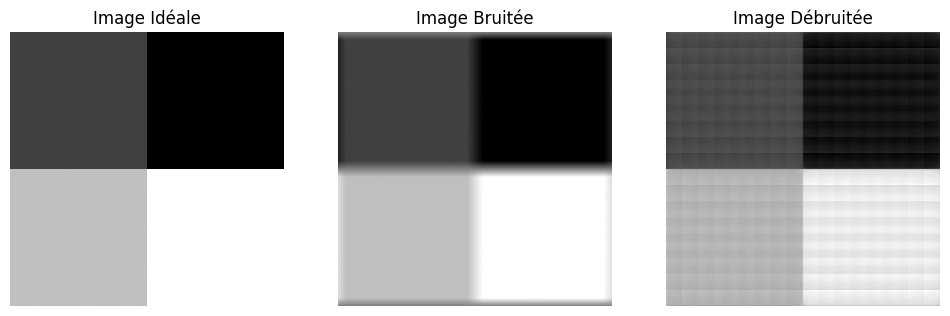

Taille du filtre : 25
SNR: 60 dB
EQM0 :  0.17822259914770022
EQM1 :  0.014984485655832259
PSNR0 :  55.6211758786262
PSNR1 :  66.374385205377


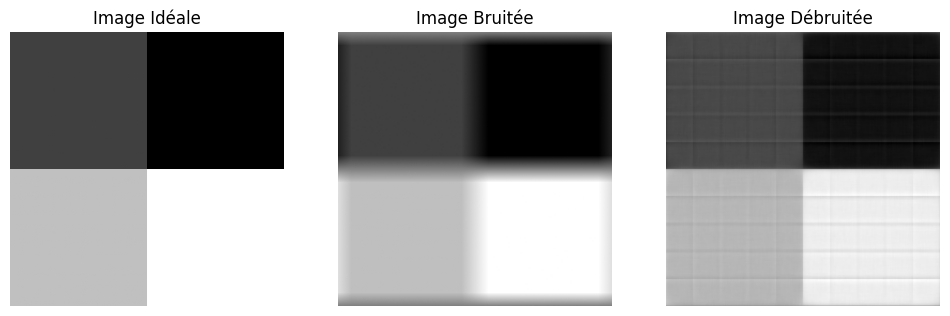

Taille du filtre : 5
SNR: 20 dB
EQM0 :  0.30922692790623635
EQM1 :  0.1153794848095564
PSNR0 :  53.228030550139906
PSNR1 :  57.509517654455294


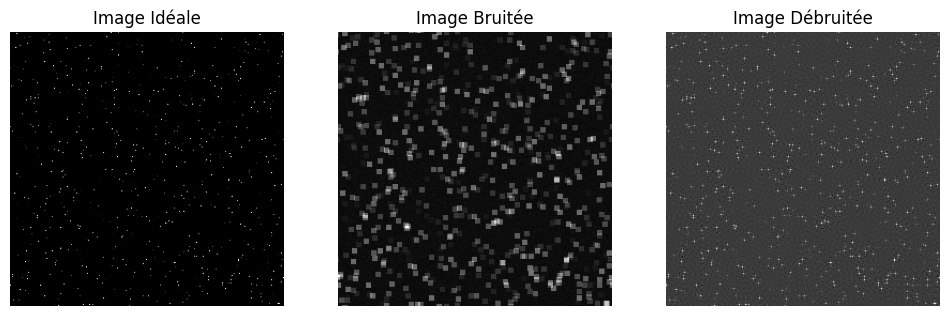

Taille du filtre : 15
SNR: 20 dB
EQM0 :  0.3199619220839699
EQM1 :  0.25646602991904077
PSNR0 :  53.079820638379786
PSNR1 :  54.04050511871222


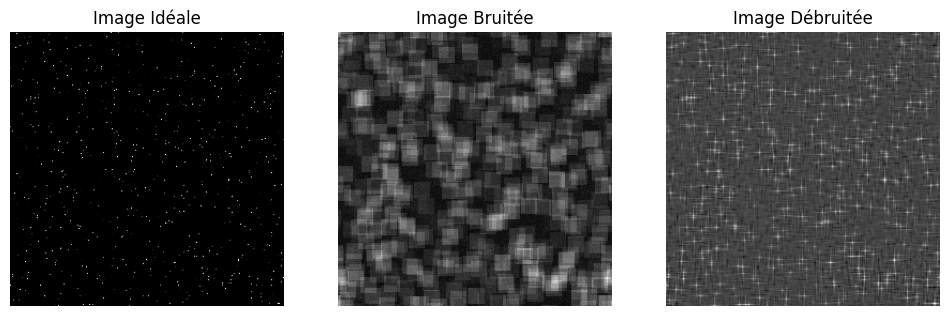

Taille du filtre : 25
SNR: 20 dB
EQM0 :  0.32093322682598946
EQM1 :  0.2915615041853758
PSNR0 :  53.066656781128295
PSNR1 :  53.4835017875119


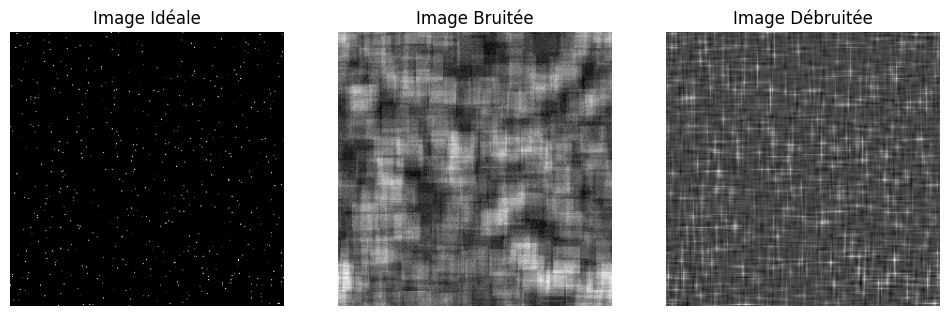

Taille du filtre : 5
SNR: 40 dB
EQM0 :  0.3091345113820471
EQM1 :  0.0992588783429137
PSNR0 :  53.22932869016743
PSNR1 :  58.163109976454884


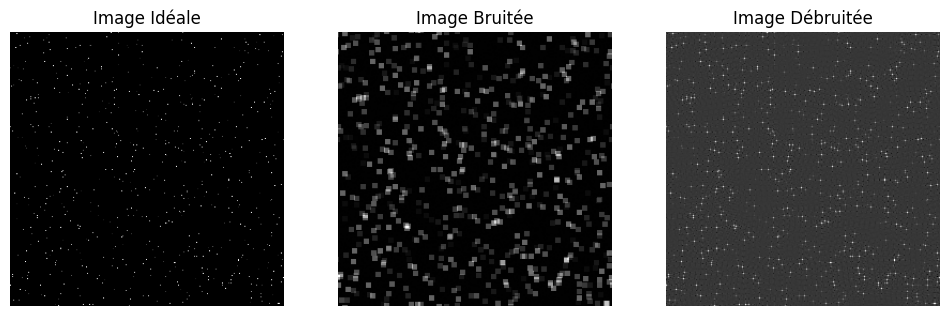

Taille du filtre : 15
SNR: 40 dB
EQM0 :  0.31991370927965324
EQM1 :  0.2542275224398559
PSNR0 :  53.08047509539878
PSNR1 :  54.07857795780005


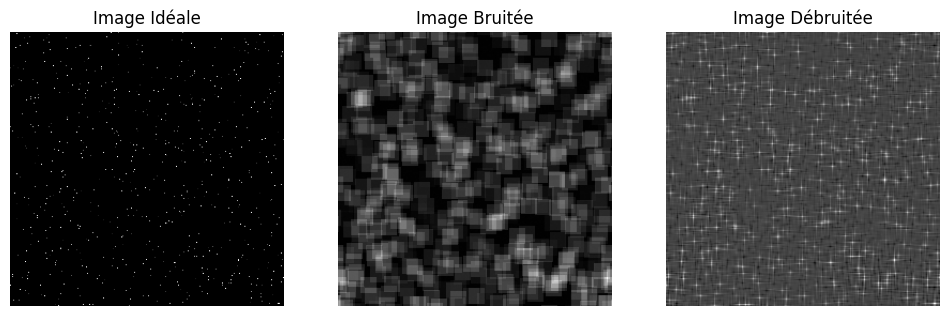

Taille du filtre : 25
SNR: 40 dB
EQM0 :  0.32089511411697247
EQM1 :  0.2906819886111457
PSNR0 :  53.067172562005524
PSNR1 :  53.49662238244812


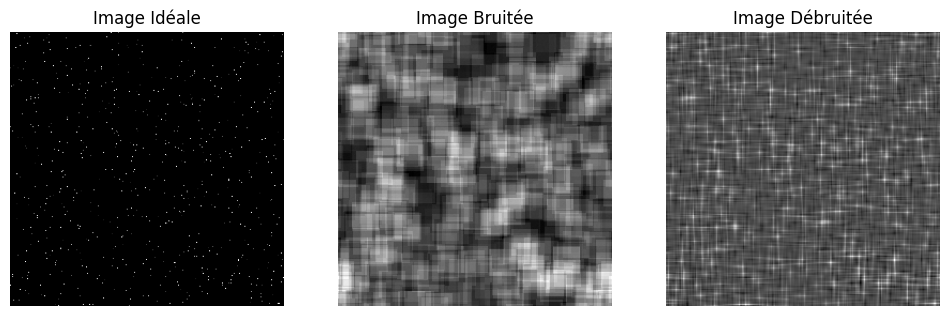

Taille du filtre : 5
SNR: 60 dB
EQM0 :  0.30913894415667764
EQM1 :  0.09908851390841004
PSNR0 :  53.22926641579532
PSNR1 :  58.170570457903366


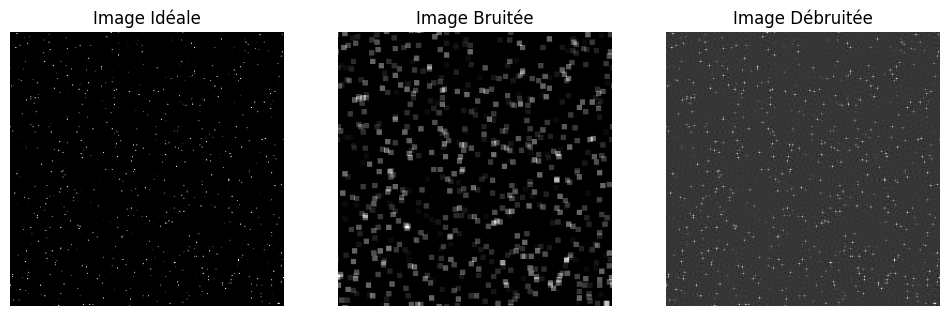

Taille du filtre : 15
SNR: 60 dB
EQM0 :  0.31991163025617064
EQM1 :  0.25420053781838076
PSNR0 :  53.08050331898951
PSNR1 :  54.079038958013456


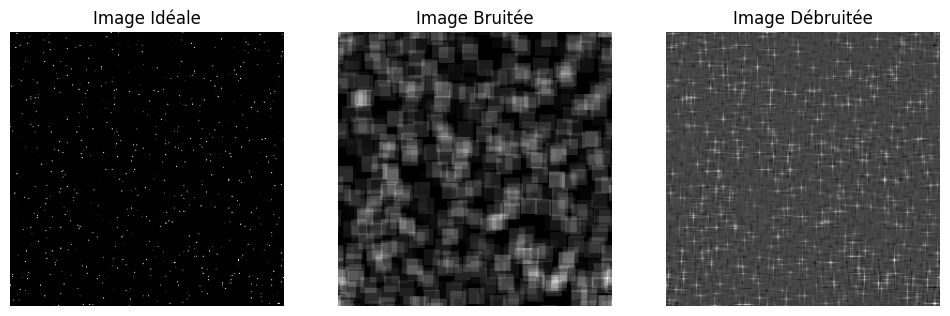

Taille du filtre : 25
SNR: 60 dB
EQM0 :  0.3208928153130123
EQM1 :  0.2906690066871049
PSNR0 :  53.06720367377403
PSNR1 :  53.49681634368744


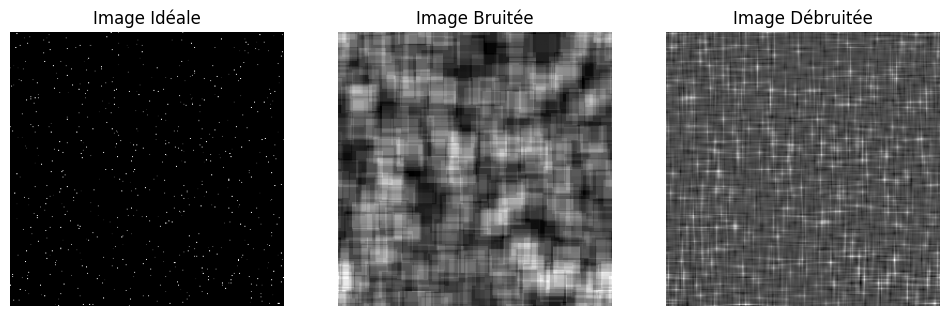

In [40]:
import numpy as np
import matplotlib.pyplot as plt

images = [img, image_constante, image_sparse]

filter_sizes = [5, 15, 25]
SNR_values = [20, 40, 60]

for i_ideal in images:
    taille_image = i_ideal.shape

    for SNRdb in SNR_values:
        for filter_size in filter_sizes:
            h = np.ones((filter_size, filter_size)) / (filter_size * filter_size)

            H = np.zeros_like(i_ideal)
            H[:h.shape[0], :h.shape[1]] = h
            H = np.roll(H, -int(h.shape[0] / 2.0), axis=0)
            H = np.roll(H, -int(h.shape[1] / 2.0), axis=1)

            D = np.fft.fft2(H)
            DT = np.conj(D)

            my_conv = np.real(np.fft.ifft2(D * np.fft.fft2(i_ideal)))

            SNR = (10 ** (SNRdb / 10))
            ps_in = np.sum(np.sum(my_conv ** 2)) / (my_conv.shape[0] * my_conv.shape[1])
            pb_norm = ps_in / SNR
            Mnoise = np.sqrt(pb_norm) * np.random.randn(my_conv.shape[0], my_conv.shape[1])
            MCB = my_conv + Mnoise

            alpha_regularisation = 0.001
            i_ideal_est = np.real(np.fft.ifft2(1 / (DT * D + alpha_regularisation) * DT * np.fft.fft2(MCB)))

            EQM0 = np.mean(np.square(MCB - i_ideal))
            EQM1 = np.mean(np.square(i_ideal_est - i_ideal))

            PSNR0 = 20 * np.log10(255.0 / np.sqrt(EQM0))
            PSNR1 = 20 * np.log10(255.0 / np.sqrt(EQM1))

            print(f"Taille du filtre : {filter_size}")
            print(f"SNR: {SNRdb} dB")
            print("EQM0 : ", EQM0)
            print("EQM1 : ", EQM1)
            print("PSNR0 : ", PSNR0)
            print("PSNR1 : ", PSNR1)

            col = 3
            plt.figure(figsize=(12, 16))
            plt.subplot(1, col, 1)
            plt.title("Image Idéale")
            plt.imshow(i_ideal, cmap='gray')
            plt.axis('off')

            plt.subplot(1, col, 2)
            plt.title("Image Bruitée")
            plt.imshow(MCB, cmap='gray')
            plt.axis('off')

            plt.subplot(1, col, 3)
            plt.title("Image Débruitée")
            plt.imshow(i_ideal_est, cmap='gray')
            plt.axis('off')

            plt.show()


6. Idem que la question 2.) avec une norme L1 et TV (Total Variation) par ADMM.

In [44]:
import numpy as np

def soft_thresholding(x, threshold):
    return np.sign(x) * np.maximum(np.abs(x) - threshold, 0)

def ADMM_L1_TV(y, H, mu, rho, tol=1e-2, max_iter=100, verbose=False):
    x = y.copy()
    z = np.zeros_like(y)
    u = np.zeros_like(y)

    F_H = np.fft.fft2(H)
    F_H_conj = np.conj(F_H)

    dx = np.fft.fftshift(np.fft.fftfreq(y.shape[0]))
    dy = np.fft.fftshift(np.fft.fftfreq(y.shape[1]))
    Dx, Dy = np.meshgrid(dx, dy, indexing='ij')
    F_grad_x = 1j * 2 * np.pi * Dx
    F_grad_y = 1j * 2 * np.pi * Dy

    for k in range(max_iter):
        A = mu * np.abs(F_H)**2 + rho * (np.abs(F_grad_x)**2 + np.abs(F_grad_y)**2)
        B = mu * F_H_conj * np.fft.fft2(y) + np.conj(F_grad_x) * np.fft.fft2(rho * z + u) + np.conj(F_grad_y) * np.fft.fft2(rho * z + u)
        x_new = np.fft.ifft2(B / A).real

        grad_x_new = np.fft.ifft2(F_grad_x * np.fft.fft2(x_new)).real
        grad_y_new = np.fft.ifft2(F_grad_y * np.fft.fft2(x_new)).real
        grad_new = grad_x_new + grad_y_new

        z_new = soft_thresholding(grad_new - u / rho, 1 / rho)

        u_new = u + rho * (z_new - grad_new)
        if verbose:
          print(f"Iteration {k+1} / {max_iter}")
          print(f"Norme de la différence entre x et x_new: {np.linalg.norm(x - x_new)}")

        if np.linalg.norm(x - x_new) / np.linalg.norm(x) < tol:
            break

        x, z, u = x_new, z_new, u_new

    return x

## Le code ci-dessous est commenté car très long à exécuter, le code permet de tester un bon nombre de valeurs différentes sur mu et rho afin d'essayer d'obtenir la meilleure valeur.

Traitement de l'image nommée : i_ideal
Traitement de mu = 1e-07
Traitement de rho = 1e-07
Traitement de rho = 1e-06
Traitement de rho = 1e-05
Traitement de rho = 0.0001
Traitement de rho = 0.001
Traitement de rho = 0.01
Traitement de rho = 0.1
Traitement de rho = 1
Traitement de mu = 1e-06
Traitement de rho = 1e-07
Traitement de rho = 1e-06
Traitement de rho = 1e-05
Traitement de rho = 0.0001
Traitement de rho = 0.001
Traitement de rho = 0.01
Traitement de rho = 0.1
Traitement de rho = 1
Traitement de mu = 1e-05
Traitement de rho = 1e-07
Traitement de rho = 1e-06
Traitement de rho = 1e-05
Traitement de rho = 0.0001
Traitement de rho = 0.001
Traitement de rho = 0.01
Traitement de rho = 0.1
Traitement de rho = 1
Traitement de mu = 0.0001
Traitement de rho = 1e-07
Traitement de rho = 1e-06
Traitement de rho = 1e-05
Traitement de rho = 0.0001
Traitement de rho = 0.001
Traitement de rho = 0.01
Traitement de rho = 0.1
Traitement de rho = 1
Traitement de mu = 0.001
Traitement de rho = 1e-07
T

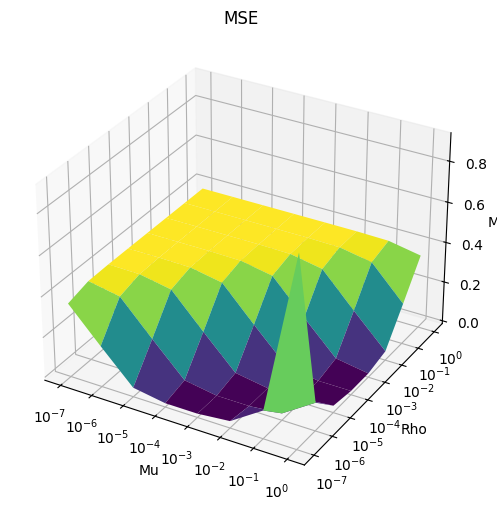

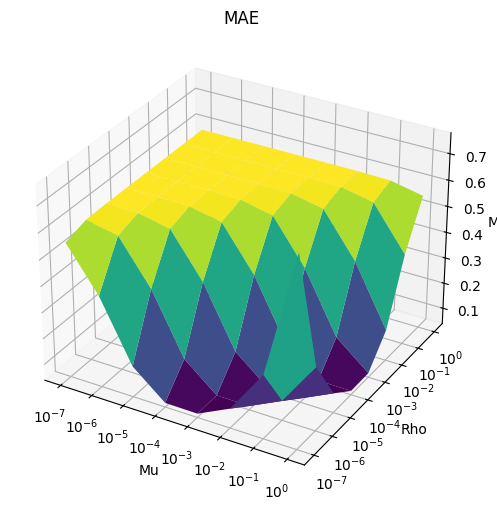

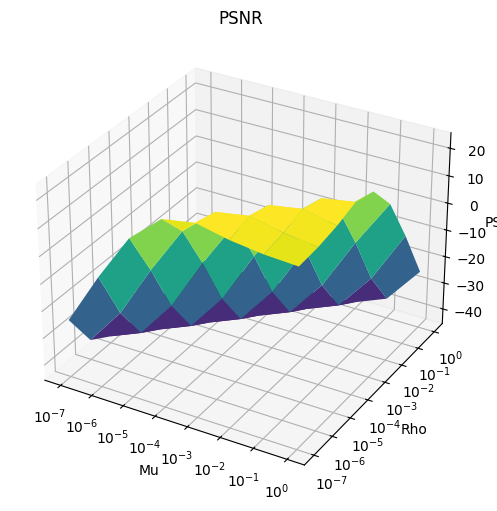

Traitement de l'image nommée : i_ideal
Traitement de mu = 1e-07
Traitement de rho = 1e-07
Traitement de rho = 1e-06
Traitement de rho = 1e-05
Traitement de rho = 0.0001
Traitement de rho = 0.001
Traitement de rho = 0.01
Traitement de rho = 0.1
Traitement de rho = 1
Traitement de mu = 1e-06
Traitement de rho = 1e-07
Traitement de rho = 1e-06
Traitement de rho = 1e-05
Traitement de rho = 0.0001
Traitement de rho = 0.001
Traitement de rho = 0.01
Traitement de rho = 0.1
Traitement de rho = 1
Traitement de mu = 1e-05
Traitement de rho = 1e-07
Traitement de rho = 1e-06
Traitement de rho = 1e-05
Traitement de rho = 0.0001
Traitement de rho = 0.001
Traitement de rho = 0.01
Traitement de rho = 0.1
Traitement de rho = 1
Traitement de mu = 0.0001
Traitement de rho = 1e-07
Traitement de rho = 1e-06
Traitement de rho = 1e-05
Traitement de rho = 0.0001
Traitement de rho = 0.001
Traitement de rho = 0.01
Traitement de rho = 0.1
Traitement de rho = 1
Traitement de mu = 0.001
Traitement de rho = 1e-07
T

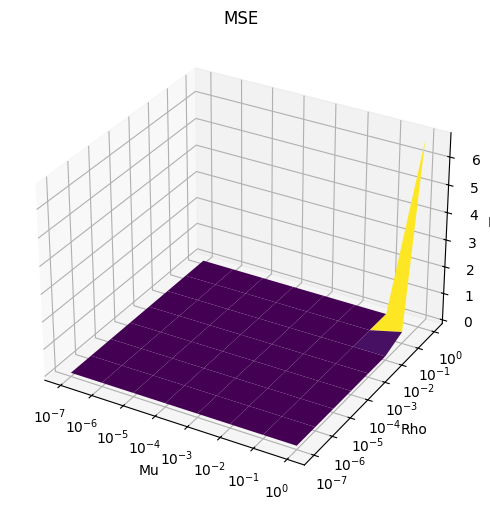

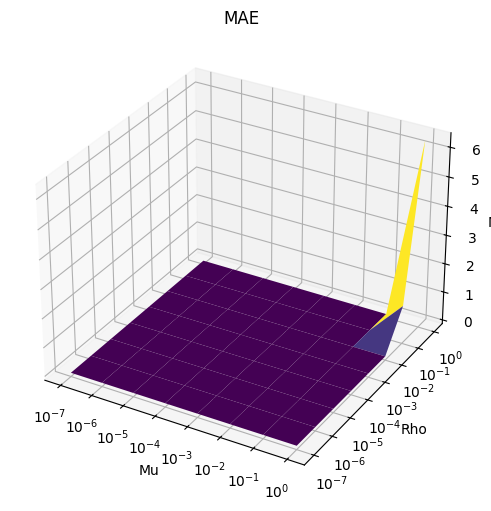

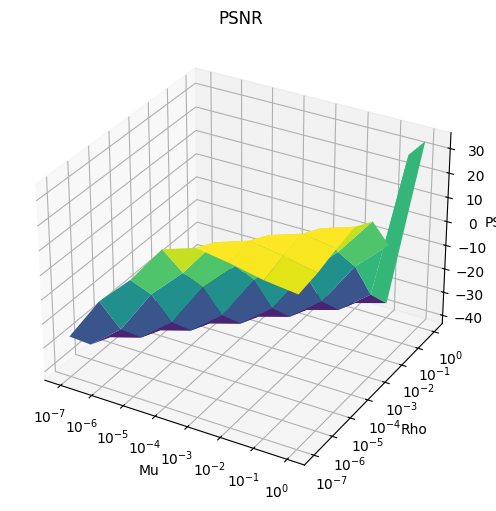

Traitement de l'image nommée : i_ideal
Traitement de mu = 1e-07
Traitement de rho = 1e-07
Traitement de rho = 1e-06
Traitement de rho = 1e-05
Traitement de rho = 0.0001
Traitement de rho = 0.001
Traitement de rho = 0.01
Traitement de rho = 0.1
Traitement de rho = 1
Traitement de mu = 1e-06
Traitement de rho = 1e-07
Traitement de rho = 1e-06
Traitement de rho = 1e-05
Traitement de rho = 0.0001
Traitement de rho = 0.001
Traitement de rho = 0.01
Traitement de rho = 0.1
Traitement de rho = 1
Traitement de mu = 1e-05
Traitement de rho = 1e-07
Traitement de rho = 1e-06
Traitement de rho = 1e-05
Traitement de rho = 0.0001
Traitement de rho = 0.001
Traitement de rho = 0.01
Traitement de rho = 0.1
Traitement de rho = 1
Traitement de mu = 0.0001
Traitement de rho = 1e-07
Traitement de rho = 1e-06
Traitement de rho = 1e-05
Traitement de rho = 0.0001
Traitement de rho = 0.001
Traitement de rho = 0.01
Traitement de rho = 0.1
Traitement de rho = 1
Traitement de mu = 0.001
Traitement de rho = 1e-07
T

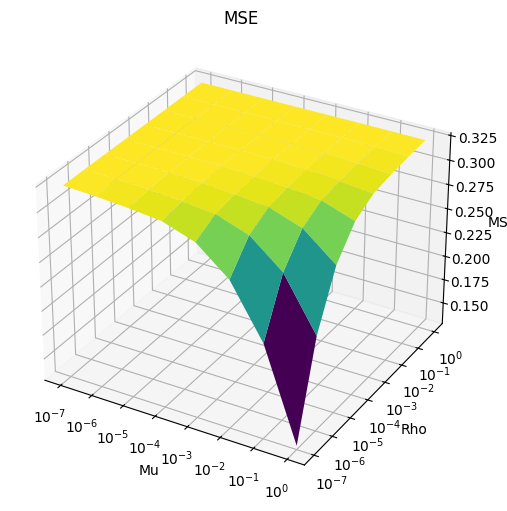

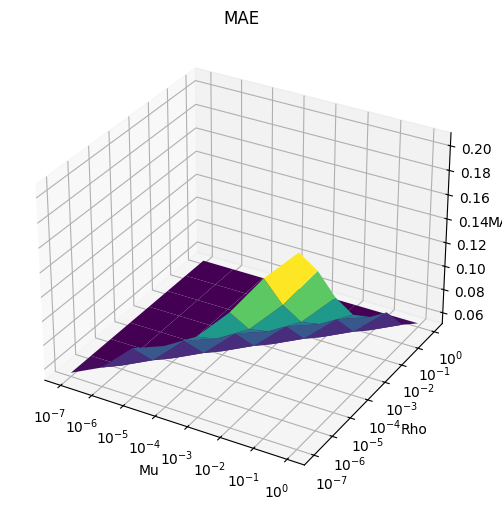

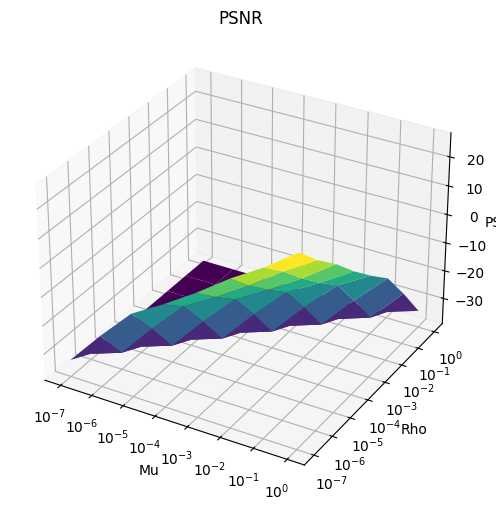

In [53]:
# import numpy as np
# import matplotlib.pyplot as plt
# from sklearn.metrics import mean_absolute_error, mean_squared_error
# from skimage.metrics import peak_signal_noise_ratio as psnr

# mu_values = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1]
# rho_values = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1]

# images = [img, image_constante, image_sparse]
# h = np.ones((15, 15)) / (15.0 * 15.0)

# for i_ideal in images:
#     print(f"Traitement de l'image nommée : {i_ideal=}".split('=')[0])
#     taille_image = i_ideal.shape

#     H = np.zeros_like(i_ideal)
#     H[:h.shape[0], :h.shape[1]] = h
#     H = np.roll(H, -int(h.shape[0] / 2.0), axis=0)
#     H = np.roll(H, -int(h.shape[1] / 2.0), axis=1)

#     my_conv = np.real(np.fft.ifft2(np.fft.fft2(H) * np.fft.fft2(i_ideal)))

#     SNRdb = 40
#     SNR = (10 ** (SNRdb / 10))
#     ps_in = np.sum(np.sum(my_conv ** 2)) / (i_ideal.shape[0] * i_ideal.shape[1])
#     pb_norm = ps_in / SNR
#     Mnoise = np.sqrt(pb_norm) * np.random.randn(i_ideal.shape[0], i_ideal.shape[1])
#     MCB = my_conv + Mnoise

#     mse_scores = np.zeros((len(mu_values), len(rho_values)))
#     mae_scores = np.zeros((len(mu_values), len(rho_values)))
#     psnr_scores = np.zeros((len(mu_values), len(rho_values)))

#     for i, mu in enumerate(mu_values):
#         print(f"Traitement de mu = {mu}")
#         for j, rho in enumerate(rho_values):
#             print(f"Traitement de rho = {rho}")
#             restored_image = ADMM_L1_TV(MCB, H, mu, rho)

#             mse_scores[i, j] = mean_squared_error(i_ideal, restored_image)
#             mae_scores[i, j] = mean_absolute_error(i_ideal, restored_image)
#             psnr_scores[i, j] = psnr(i_ideal, restored_image, data_range=restored_image.max() - restored_image.min())

#     def plot_3d_surface(X, Y, Z, title):
#         import matplotlib.ticker as mticker

#         def log_tick_formatter(val, pos=None):
#             return f"$10^{{{int(val)}}}$"

#         fig = plt.figure(figsize=(8, 6))
#         ax = fig.add_subplot(111, projection='3d')
#         X, Y = np.meshgrid(X, Y)
#         ax.plot_surface(np.log10(X), np.log10(Y), Z.T, cmap='viridis')
#         ax.set_xlabel('Mu')
#         ax.set_ylabel('Rho')
#         ax.set_zlabel(title)
#         ax.set_title(title)
#         ax.xaxis.set_major_formatter(mticker.FuncFormatter(log_tick_formatter))
#         ax.xaxis.set_major_locator(mticker.MaxNLocator(integer=True))
#         ax.yaxis.set_major_formatter(mticker.FuncFormatter(log_tick_formatter))
#         ax.yaxis.set_major_locator(mticker.MaxNLocator(integer=True))
#         plt.show()

#     plot_3d_surface(mu_values, rho_values, mse_scores, 'MSE')
#     plot_3d_surface(mu_values, rho_values, mae_scores, 'MAE')
#     plot_3d_surface(mu_values, rho_values, psnr_scores, 'PSNR')


Dimensions de MCB: (600, 800), Dimensions de H: (600, 800)
Iteration 1 / 100
Norme de la différence entre x et x_new: 364.6540609978463
Iteration 2 / 100
Norme de la différence entre x et x_new: 243.50283900928136
Iteration 3 / 100
Norme de la différence entre x et x_new: 108.7976230029151
Iteration 4 / 100
Norme de la différence entre x et x_new: 71.73031562289077
Iteration 5 / 100
Norme de la différence entre x et x_new: 53.993926674301186
Iteration 6 / 100
Norme de la différence entre x et x_new: 43.4760608121354
Iteration 7 / 100
Norme de la différence entre x et x_new: 36.462468859060415
Iteration 8 / 100
Norme de la différence entre x et x_new: 31.430735503403042
Iteration 9 / 100
Norme de la différence entre x et x_new: 27.637150225120024
Iteration 10 / 100
Norme de la différence entre x et x_new: 24.6723012420874
Iteration 11 / 100
Norme de la différence entre x et x_new: 22.290696626327215
Iteration 12 / 100
Norme de la différence entre x et x_new: 20.335519091939435
Iteration

<ipython-input-36-d127c107fa80>:4: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum = 20 * np.log(np.abs(fshift))


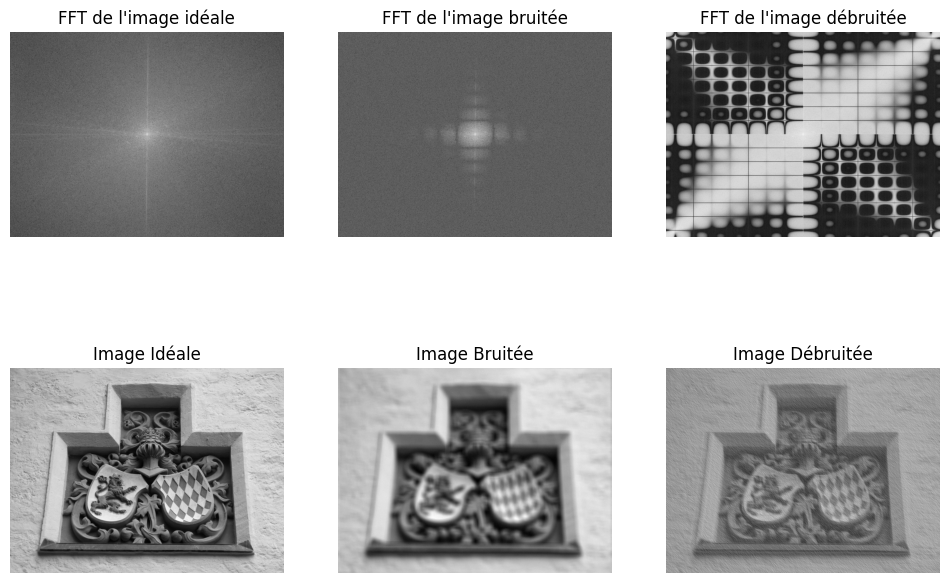

Dimensions de MCB: (256, 256), Dimensions de H: (256, 256)
Iteration 1 / 100
Norme de la différence entre x et x_new: 553.4314231312516
Iteration 2 / 100
Norme de la différence entre x et x_new: 366.26943952141295
Iteration 3 / 100
Norme de la différence entre x et x_new: 165.02773174213513
Iteration 4 / 100
Norme de la différence entre x et x_new: 111.51138620471026
Iteration 5 / 100
Norme de la différence entre x et x_new: 85.87360942649892
Iteration 6 / 100
Norme de la différence entre x et x_new: 70.60737564445081
Iteration 7 / 100
Norme de la différence entre x et x_new: 60.38871473369854
Iteration 8 / 100
Norme de la différence entre x et x_new: 53.0166970587584
Iteration 9 / 100
Norme de la différence entre x et x_new: 47.40986810576062
Iteration 10 / 100
Norme de la différence entre x et x_new: 42.973580609579926
Iteration 11 / 100
Norme de la différence entre x et x_new: 39.35406307304461
Iteration 12 / 100
Norme de la différence entre x et x_new: 36.328220039138486
Iteration 

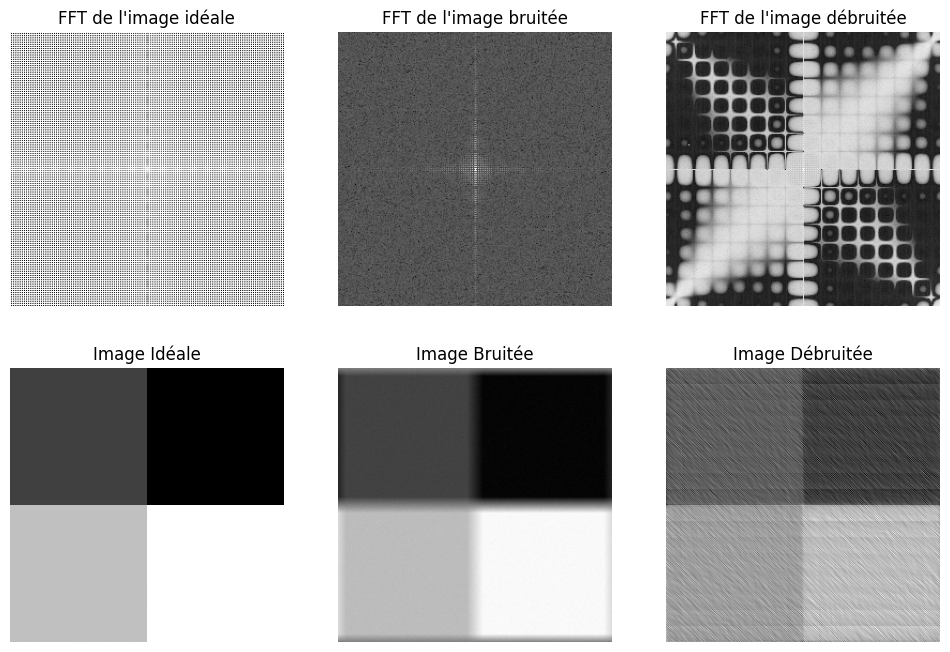

Dimensions de MCB: (256, 256), Dimensions de H: (256, 256)
Iteration 1 / 100
Norme de la différence entre x et x_new: 77.87018217339671
Iteration 2 / 100
Norme de la différence entre x et x_new: 30.06722486045137
Iteration 3 / 100
Norme de la différence entre x et x_new: 11.81215322214626
Iteration 4 / 100
Norme de la différence entre x et x_new: 7.2355989023798495
Iteration 5 / 100
Norme de la différence entre x et x_new: 5.187785336591343
Iteration 6 / 100
Norme de la différence entre x et x_new: 4.041324298603618
Iteration 7 / 100
Norme de la différence entre x et x_new: 3.3147181050999976
Iteration 8 / 100
Norme de la différence entre x et x_new: 2.814914667365767
Iteration 9 / 100
Norme de la différence entre x et x_new: 2.4500939086913145
Iteration 10 / 100
Norme de la différence entre x et x_new: 2.1715305146111987
Iteration 11 / 100
Norme de la différence entre x et x_new: 1.9512461123923819
Iteration 12 / 100
Norme de la différence entre x et x_new: 1.772155222531058
Iteration

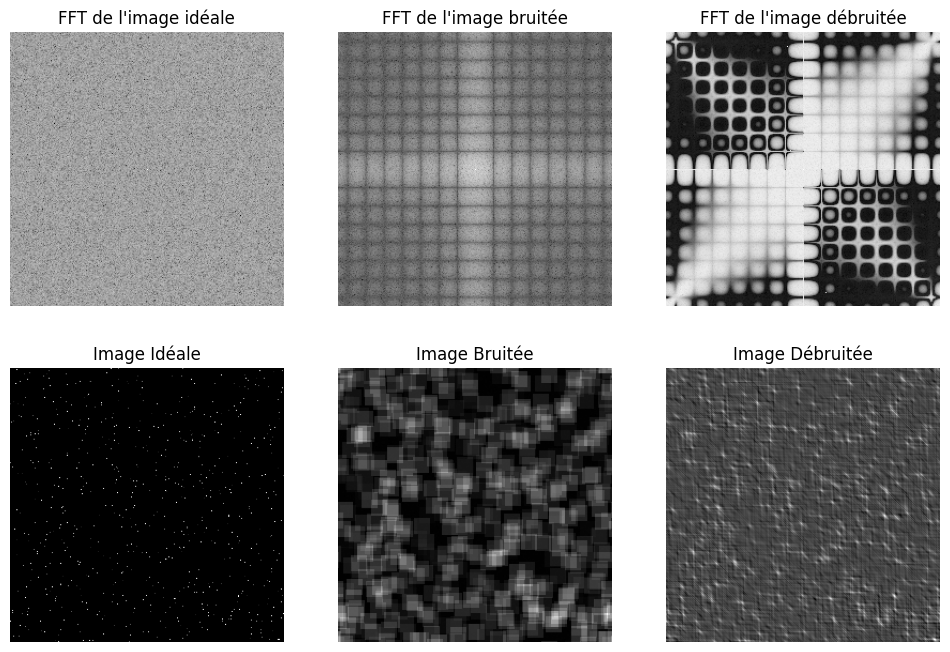

In [55]:
images = [img, image_constante, image_sparse]
h = np.ones((15, 15)) / (15.0 * 15.0)

for i_ideal in images:
    taille_image = i_ideal.shape

    H = np.zeros_like(i_ideal)
    H[:h.shape[0], :h.shape[1]] = h
    H = np.roll(H, -int(h.shape[0] / 2.0), axis=0)
    H = np.roll(H, -int(h.shape[1] / 2.0), axis=1)

    my_conv = np.real(np.fft.ifft2(np.fft.fft2(H) * np.fft.fft2(i_ideal)))

    SNRdb = 40
    SNR = (10 ** (SNRdb / 10))
    ps_in = np.sum(np.sum(my_conv ** 2)) / (i_ideal.shape[0] * i_ideal.shape[1])
    pb_norm = ps_in / SNR
    Mnoise = np.sqrt(pb_norm) * np.random.randn(i_ideal.shape[0], i_ideal.shape[1])
    MCB = my_conv + Mnoise

    print(f"Dimensions de MCB: {MCB.shape}, Dimensions de H: {H.shape}")

    i_ideal_est = ADMM_L1_TV(MCB, H, mu=1, rho=1e-5, verbose=True)

    EQM0 = np.mean(np.square(MCB - i_ideal))
    EQM1 = np.mean(np.square(i_ideal_est - i_ideal))

    print("EQM0 : ", EQM0)
    print("EQM1 : ", EQM1)

    PSNR0 = 20 * np.log10(255.0 / np.sqrt(EQM0))
    PSNR1 = 20 * np.log10(255.0 / np.sqrt(EQM1))

    print("PSNR0 : ", PSNR0)
    print("PSNR1 : ", PSNR1)

    col = 3
    plt.figure(figsize=(12, 16))
    plt.subplot(1, col, 1)
    plt.title("Image Idéale")
    plt.imshow(i_ideal, cmap='gray')
    plt.axis('off')

    plt.subplot(1, col, 2)
    plt.title("Image Bruitée")
    plt.imshow(MCB, cmap='gray')
    plt.axis('off')

    plt.subplot(1, col, 3)
    plt.title("Image Débruitée")
    plt.imshow(i_ideal_est, cmap='gray')
    plt.axis('off')

    plt.subplot(2, col, 1)
    plt.title("FFT de l'image idéale")
    plt.imshow(show_fft(i_ideal), cmap='gray')
    plt.axis('off')

    plt.subplot(2, col, 2)
    plt.title("FFT de l'image bruitée")
    plt.imshow(show_fft(MCB), cmap='gray')
    plt.axis('off')

    plt.subplot(2, col, 3)
    plt.title("FFT de l'image débruitée")
    plt.imshow(show_fft(i_ideal_est), cmap='gray')
    plt.axis('off')

    plt.show()